In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import re
from sklearn import preprocessing
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.figure_factory as ff
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.ticker as mtick
import plotly.graph_objects as go
import random
import math

Reading Data

In [3]:
data = pd.read_csv("/content/drive/MyDrive/shivangi_dic/train.csv")

data

<ipython-input-3-17038882cc77>:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv("/content/drive/MyDrive/shivangi_dic/train.csv")


,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard


In [4]:
data.describe()

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
count,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,98035.000000,100000.000000,100000.000000
mean,4194.170850,17.091280,22.47443,72.466040,21.068780,27.754251,32.285173,1403.118217
std,3183.686167,117.404834,129.05741,466.422621,14.860104,193.177339,5.116875,8306.041270
min,303.645417,-1.000000,0.00000,1.000000,-5.000000,0.000000,20.000000,0.000000
25%,1625.568229,3.000000,4.00000,8.000000,10.000000,3.000000,28.052567,30.306660
50%,3093.745000,6.000000,5.00000,13.000000,18.000000,6.000000,32.305784,69.249473
75%,5957.448333,7.000000,7.00000,20.000000,28.000000,9.000000,36.496663,161.224249
max,15204.633333,1798.000000,1499.00000,5797.000000,67.000000,2597.000000,50.000000,82331.000000


Checking the datatypes of the features.

In [5]:
data.dtypes

ID                           object
Customer_ID                  object
Month                        object
Name                         object
Age                          object
SSN                          object
Occupation                   object
Annual_Income                object
Monthly_Inhand_Salary       float64
Num_Bank_Accounts             int64
Num_Credit_Card               int64
Interest_Rate                 int64
Num_of_Loan                  object
Type_of_Loan                 object
Delay_from_due_date           int64
Num_of_Delayed_Payment       object
Changed_Credit_Limit         object
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt             object
Credit_Utilization_Ratio    float64
Credit_History_Age           object
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly      object
Payment_Behaviour            object
Monthly_Balance              object
Credit_Score                

Checking the dimensions of the data

In [6]:
num_rows, num_cols = data.shape
print("Number of rows:", num_rows)
print("Number of columns:", num_cols)

Number of rows: 100000
Number of columns: 28


Checking for null values

In [7]:
data.isnull()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,True,False,...,False,False,False,True,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99996,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99997,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
99998,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


Dropping null rows for some columns

In [8]:
data.dropna(subset=['Type_of_Loan' , 'Num_of_Delayed_Payment' , 'Num_Credit_Inquiries'  , 'Amount_invested_monthly' , 'Monthly_Balance' ], inplace=True)


Clean 'Age' column by removing non-numeric characters and converting to integers

In [9]:

data['Age'] = data['Age'].str.replace('_', '', regex=True)
data['Age'] = data['Age'].astype(int)
data = data[data['Age'] >= 0]



Cleaning 'SSN' Column

In [10]:
rows_to_remove = data[data['SSN'] == '#F%$D@*&8']


df = data.drop(rows_to_remove.index)


def convert_to_numeric(ssn):
    ssn_without_hyphens = ssn.replace("-", "")
    try:
        return int(ssn_without_hyphens)
    except ValueError:
        return np.nan

# Apply the function to the 'SSN' column
data['SSN'] = data['SSN'].apply(convert_to_numeric)
# Drop rows with NaN values
data.dropna(inplace=True)

# Display the modified DataFrame
print(data)



            ID Customer_ID     Month             Name  Age          SSN  \
0       0x1602   CUS_0xd40   January    Aaron Maashoh   23  821000265.0   
6       0x1608   CUS_0xd40      July    Aaron Maashoh   23  821000265.0   
8       0x160e  CUS_0x21b1   January  Rick Rothackerj   28    4075839.0   
9       0x160f  CUS_0x21b1  February  Rick Rothackerj   28    4075839.0   
10      0x1610  CUS_0x21b1     March  Rick Rothackerj   28    4075839.0   
...        ...         ...       ...              ...  ...          ...   
99994  0x25fe8  CUS_0x942c     March            Nicks   25   78735990.0   
99995  0x25fe9  CUS_0x942c     April            Nicks   25   78735990.0   
99996  0x25fea  CUS_0x942c       May            Nicks   25   78735990.0   
99997  0x25feb  CUS_0x942c      June            Nicks   25   78735990.0   
99999  0x25fed  CUS_0x942c    August            Nicks   25   78735990.0   

      Occupation Annual_Income  Monthly_Inhand_Salary  Num_Bank_Accounts  ...  \
0      Scientist  

Cleaning 'Payment_Behaviour' column and doing label encoding to convert categorical values to numerical.

In [11]:
rows_to_remove = data[data['Payment_Behaviour'] == '!@9#%8']

data = data.drop(rows_to_remove.index)

unique_values = data['Payment_Behaviour'].unique()
print(unique_values)
# Encode labels in column 'Payment_Behaviour'.
data['Payment_Behaviour']= label_encoder.fit_transform(data['Payment_Behaviour'])
data['Payment_Behaviour'].unique()


['High_spent_Small_value_payments' 'Low_spent_Small_value_payments'
 'High_spent_Large_value_payments' 'Low_spent_Large_value_payments'
 'High_spent_Medium_value_payments' 'Low_spent_Medium_value_payments']


array([2, 5, 0, 3, 1, 4])

Label encoding for Month column

In [12]:
# label Encoding for Month data
unique_values = data['Month'].unique()
print(unique_values)
data['Month']= label_encoder.fit_transform(data['Month'])
data['Month'].unique()


['January' 'July' 'February' 'March' 'May' 'June' 'August' 'April']


array([3, 4, 2, 6, 7, 5, 1, 0])

cleaning 'Occupation' Column and doing label encoding.

In [13]:

# Remove rows where 'occupation' is '------' using drop
data1 = data.drop(data[data['Occupation'] == '_______'].index)
data=data1
unique_values = data['Occupation'].unique()
print(unique_values)


data['Occupation']= label_encoder.fit_transform(data['Occupation'])

data['Occupation'].unique()

['Scientist' 'Teacher' 'Engineer' 'Entrepreneur' 'Lawyer' 'Media_Manager'
 'Doctor' 'Journalist' 'Manager' 'Mechanic' 'Writer' 'Accountant'
 'Architect' 'Musician' 'Developer']


array([12, 13,  4,  5,  7, 10,  3,  6,  8,  9, 14,  0,  1, 11,  2])

Cleaning 'Type_of_Loan' and doing label encoding.

In [14]:
# Label encoding 'Type_of_Loan'
data = data.drop(data[data['Type_of_Loan'] == ' '].index)

unique_values = data['Type_of_Loan'].unique()
print(unique_values)

data['Type_of_Loan']= label_encoder.fit_transform(data['Type_of_Loan'])

data['Type_of_Loan'].unique()

['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan'
 'Credit-Builder Loan' 'Auto Loan, Auto Loan, and Not Specified' ...
 'Home Equity Loan, Auto Loan, Auto Loan, and Auto Loan'
 'Payday Loan, Student Loan, Mortgage Loan, and Not Specified'
 'Personal Loan, Auto Loan, Mortgage Loan, Student Loan, and Student Loan']


array([ 128,  682,   63, ..., 2098, 4813, 4895])

**Cleaning  'Num_of_Loan'  column**

In [15]:
### processing the no_of_loan columns change it to int
data = data[data['Num_of_Loan'].str.match(r'^\d+$')]
data['Num_of_Loan'] = data['Num_of_Loan'].astype(int)
data = data[data['Num_of_Loan'] >= 0]

**Cleaning  'Changed_Credit_Limit'  column**

In [16]:
### processing the Changed_Credit_Limit change it to int
data = data[~data['Changed_Credit_Limit'].str.contains('_')]
data['Changed_Credit_Limit'] = data['Changed_Credit_Limit'].astype(float)
data = data[data['Changed_Credit_Limit'] >= 0]


**Cleaning  'Outstanding_Debt'  column**

In [17]:
## Processing the outstanding Debt

data['Outstanding_Debt'] = data['Outstanding_Debt'].str.replace('[^\d.]', '', regex=True)
data['Outstanding_Debt'] = data['Outstanding_Debt'].astype(float)
data = data[data['Outstanding_Debt'] >= 0]

**Cleaning   'Credit_History_Age'   column**

In [18]:
### Credit_History_Age
unique_values = data['Credit_History_Age'].unique()
data['Credit_History_Age']= label_encoder.fit_transform(data['Credit_History_Age'])
data['Credit_History_Age'].unique()

array([180, 188, 237, 238, 230, 239, 243, 123, 125, 112, 113, 114, 296,
       297, 298, 290, 303,  81,  87, 177, 170, 236, 136, 138, 140, 222,
       223, 224, 226, 217, 229, 240, 244, 245, 246, 392, 396, 397, 127,
       129,  97,  98, 107, 108, 111, 363, 364, 365, 366, 358, 368, 124,
        27,  28,  29,  32,  33,  56,  57, 109,  69,  72, 137, 139, 141,
       289, 391, 382, 126, 128, 130, 131, 135,  63,  68, 175, 169, 225,
        66,  67,  70, 242, 258, 370, 371, 380, 384, 208,  18,  19,  20,
        41,  42, 299,  31,  76,  77,  78, 167, 172,  10, 309, 310, 302,
       312,  54,  58,  49,  50,  43, 214, 206, 219, 220,  24, 132, 304,
       306, 300,  64, 348, 349, 351, 352, 354, 146, 276, 280, 282, 283,
       211, 212, 102, 105, 196, 197, 198, 387, 305, 340, 343, 321, 322,
       323, 325, 326,  51,  52, 116, 117,  59, 274, 266, 287, 291, 218,
       227, 228, 231, 313, 314, 327, 232, 110, 119, 376, 377, 379,  40,
       256, 257, 259, 261, 253, 267, 268, 269, 271, 273,  61,  1

**Cleaning  'Annual_Income'  column.**

In [19]:
data['Annual_Income'] = data['Annual_Income'].str.replace('[^\d.]', '', regex=True)
data['Annual_Income'] = data['Annual_Income'].replace(['NaN', 'inf'], np.nan)
data['Annual_Income'] = data['Annual_Income'].astype(float)
data['Annual_Income'].fillna(0, inplace=True)
data['Annual_Income']= data['Annual_Income'].astype(float)

**Cleaning 'Payment_of_Min_Amount' column and doing label encoding.**

In [20]:
# Label encoding 'Payment_of_Min_Amount'
data = data.drop(data[data['Payment_of_Min_Amount'] == 'NM'].index)
unique_values = data['Payment_of_Min_Amount'].unique()
print(unique_values)

data['Payment_of_Min_Amount']= label_encoder.fit_transform(data['Payment_of_Min_Amount'])
data['Payment_of_Min_Amount'].unique()

['No' 'Yes']


array([0, 1])

**Cleaning and processing 'Amount_invested_monthly' and convert**

In [21]:
## Amount_invested_monthly
data['Amount_invested_monthly'] = data['Amount_invested_monthly'].str.replace('[^\d.]', '', regex=True)
data['Amount_invested_monthly'] = data['Amount_invested_monthly'].astype(float)
data = data[data['Amount_invested_monthly'] >= 0]


**Replacing invalid values with NaN in 'Monthly_Balance'**

In [22]:

# Replace invalid values with NaN in 'Monthly_Balance'
data['Monthly_Balance'] = pd.to_numeric(data['Monthly_Balance'], errors='coerce')
data = data.dropna(subset=['Monthly_Balance'])





**Creating a countplot to visualize the distribution of 'Credit_Score' labels**

['Good' 'Standard' 'Poor']


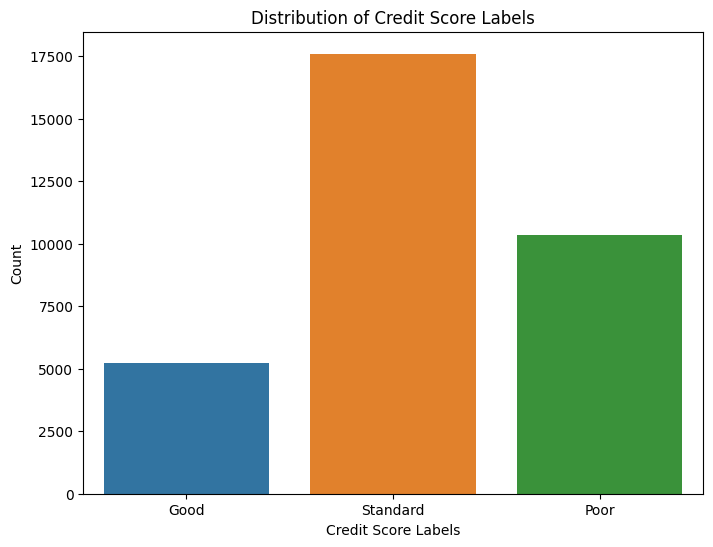

In [23]:

unique_values = data['Credit_Score'].unique()
print(unique_values)

plt.figure(figsize=(8, 6))
sns.countplot(data=data, x='Credit_Score')
plt.xlabel('Credit Score Labels')
plt.ylabel('Count')
plt.title('Distribution of Credit Score Labels')
plt.show()

**Getting customer id for NAN values in Name Column and filling missing Name values with that**

In [24]:
Customer_IDs = data[data['Name'].isnull()]['Customer_ID'].values
data['Name'] = data.groupby('Customer_ID')['Name'].transform(lambda x: x.fillna(method='ffill'))


**Filling the missing 'Monthly_Inhand_Salary' based on 'Customer_ID'**

In [25]:

data['Monthly_Inhand_Salary'] = data['Monthly_Inhand_Salary'].fillna(
    data.groupby('Customer_ID')['Monthly_Inhand_Salary'].transform('first')
)


**All the missing values have been cleaned and fixed.**

In [26]:
missing_counts = data.isnull().sum()
missing_counts

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

**Label encoding for Customer ID**

In [27]:


unique_values = data['Customer_ID'].unique()
print(unique_values)

data['Customer_ID']= label_encoder.fit_transform(data['Customer_ID'])
data['Customer_ID'].unique()

['CUS_0xd40' 'CUS_0x21b1' 'CUS_0x2dbc' ... 'CUS_0xaf61' 'CUS_0x8600'
 'CUS_0x942c']


array([10665,   910,  1628, ...,  9235,  6778,  7639])

**Label Encoding for ID**

In [28]:

unique_values = data['ID'].unique()
print(unique_values)

data['ID']= label_encoder.fit_transform(data['ID'])
data['ID'].unique()


['0x1602' '0x1608' '0x160f' ... '0x25fe9' '0x25fea' '0x25feb']


array([ 5482,  5514,  5540, ..., 20843, 20844, 20845])

**Dropping columns based on feature importance**

In [29]:

columns_to_drop = ['Num_of_Delayed_Payment', 'Credit_Mix' ]
data = data.drop(columns=columns_to_drop)

data.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Changed_Credit_Limit', 'Num_Credit_Inquiries',
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

**Converting Annual Income to numeric datatype**

In [30]:
data['Annual_Income'] = pd.to_numeric(data['Annual_Income'], errors='coerce')

data['Annual_Income'].describe()

count    3.319600e+04
mean     1.732461e+05
std      1.427159e+06
min      7.005930e+03
25%      1.874380e+04
50%      3.591490e+04
75%      6.974096e+04
max      2.419806e+07
Name: Annual_Income, dtype: float64

**Violinplot to analyze the data**

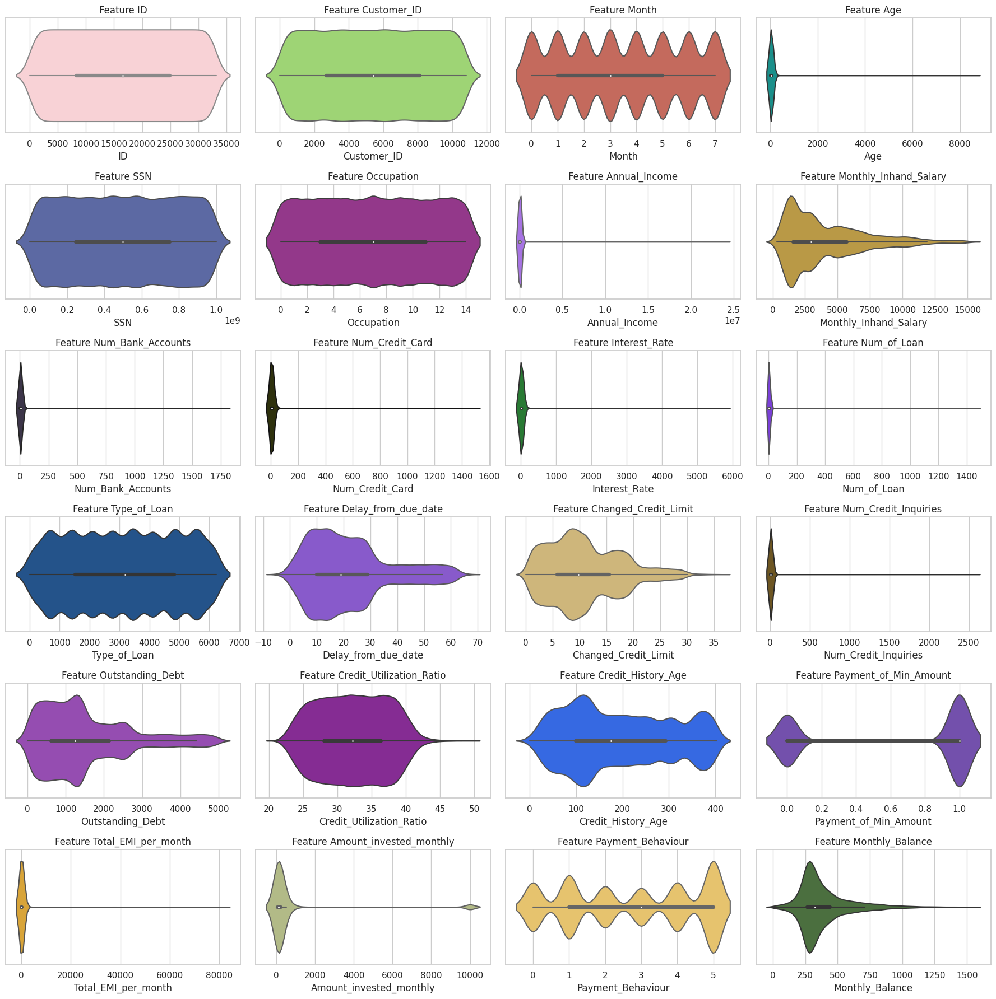

In [31]:


number_variables = data.select_dtypes(include=['number'])
sns.set(style='whitegrid')

# Calculate the number of rows and columns for subplots
num_rows = (number_variables.shape[1] - 1) // 4 + 1  # 4 columns per row
num_cols = min(number_variables.shape[1], 4)  # Maximum of 4 columns

figure, axes = plt.subplots(num_rows, num_cols, figsize=(18, 18), sharey=True)
axes = axes.flatten()

index = 0
while index < len(number_variables.columns):
    feature = number_variables.columns[index]
    sns.violinplot(x=data[feature], ax=axes[index], color=np.random.rand(3,))
    axes[index].set_title(f'Feature {feature}')
    index += 1

# Remove any extra empty subplots
for j in range(index+1, len(axes)):
    figure.delaxes(axes[j])

plt.tight_layout()
plt.show()


**Scaling the data**

**Data visualisation for every column using histogram**

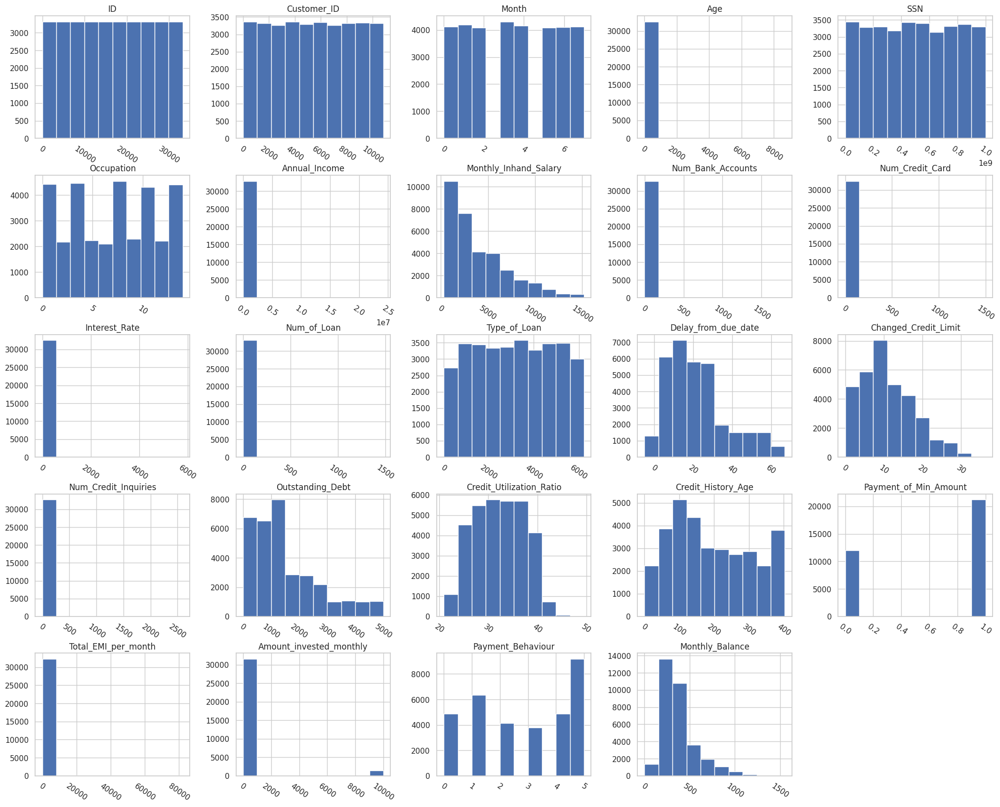

In [32]:
data_copy=data.copy()
data_copy.hist(figsize=(25,20), xrot=-35)
plt.show()

**Comparing count of each type of credit_score**

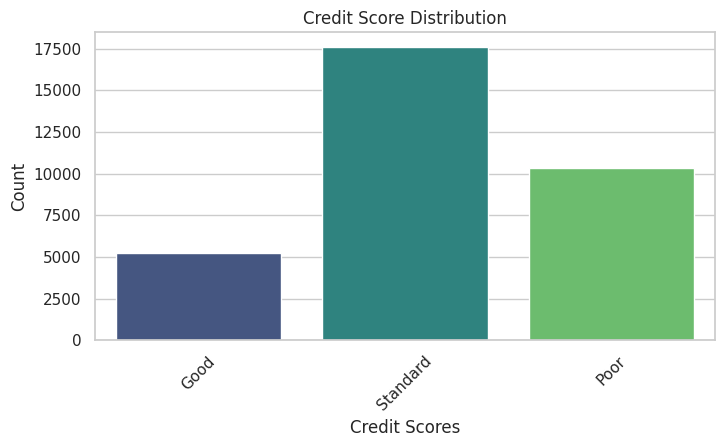

In [33]:
plt.figure(figsize=(8, 4))
sns.countplot(data=data_copy, x='Credit_Score', palette='viridis')
plt.xlabel('Credit Scores')
plt.ylabel('Count')
plt.title('Credit Score Distribution')
plt.xticks(rotation=45)
plt.show()

**Specify the age categories and their associated names**

In [34]:

age_intervals = [16, 25, 30, 45, 53, 60, 80]
age_categories = ['16-25', '25-30', '45-53', '45-60', '53-60', '60-80']

# Defined the "Age_Group" column
data_copy['Age_group'] = pd.cut(data_copy['Age'], bins=age_intervals, labels=age_categories, right=False)

print(data_copy[['Age', 'Age_group']].head())

    Age Age_group
0    23     16-25
6    23     16-25
9    28     25-30
10   28     25-30
12   28     25-30


**Visualizing distribution of credit score by age group.**

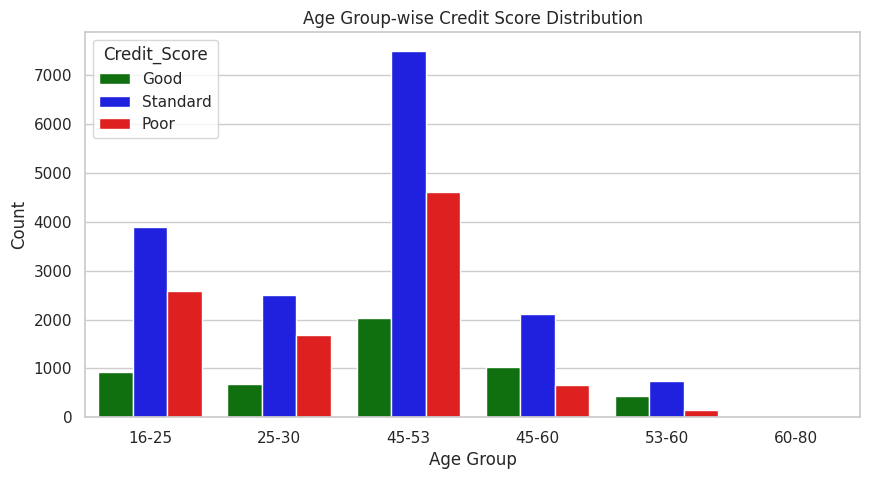

In [35]:

custom_palette = {'Good': 'green', 'Standard': 'blue', 'Poor': 'red'}
plt.figure(figsize=(10, 5))
sns.countplot(data=data_copy, x='Age_group', hue='Credit_Score', palette=custom_palette)
plt.title('Age Group-wise Credit Score Distribution')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.show()


**Scaling the data**

In [36]:

from sklearn.preprocessing import StandardScaler

numerical_columns = data.select_dtypes(include=['float64', 'int64'])
scaler = StandardScaler()
data[numerical_columns.columns] = scaler.fit_transform(numerical_columns)
data

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,-1.159936,1.681322,-0.215243,Aaron Maashoh,-0.136309,1.111146,1.164080,-0.108001,-0.706791,-0.121612,...,-0.122913,-0.590486,-1.067960,-0.119605,-1.330684,-0.165405,-0.264166,-0.408299,-0.353960,Good
6,-1.156596,1.681322,0.222281,Aaron Maashoh,-0.136309,1.111146,1.164080,-0.108001,-0.706791,-0.121612,...,-0.122913,-0.590486,-1.915380,-0.049404,-1.330684,-0.165405,-0.215784,1.218625,-0.702351,Good
9,-1.153883,-1.437372,-0.652767,Rick Rothackerj,-0.129131,-1.707439,1.396204,-0.096976,-0.315155,-0.129917,...,-0.133621,-0.762592,1.251452,0.380576,-1.330684,-0.169138,-0.283941,-1.492915,0.528687,Good
10,-1.153466,-1.437372,1.097330,Rick Rothackerj,-0.129131,-1.707439,1.396204,-0.096976,-0.315155,-0.129917,...,-0.133621,-0.762592,0.198185,0.389351,-1.330684,-0.169138,-0.274986,-1.492915,0.435730,Standard
12,-1.152318,-1.437372,1.534854,Rick Rothackerj,-0.129131,-1.707439,1.396204,-0.096976,-0.315155,-0.129917,...,-0.133621,-0.762592,0.544853,0.319151,-1.330684,-0.169138,-0.239612,1.218625,0.324951,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99991,0.442822,0.438640,-1.090292,Sarah McBridec,-0.127696,-1.613333,-1.389281,-0.107378,-0.672874,-0.063483,...,-0.096143,1.728661,0.972593,1.468689,0.751493,-0.164023,-0.286771,-1.492915,-0.226413,Standard
99994,0.442926,0.713903,1.097330,Nicks,-0.133438,-1.449843,0.467709,-0.093626,-0.211389,-0.113308,...,-0.128267,-0.848792,1.404267,0.986058,-1.330684,-0.167161,-0.234441,-0.950607,0.147440,Poor
99995,0.443031,0.713903,-1.527816,Nicks,-0.133438,-1.449843,0.467709,-0.093626,-0.211389,-0.113308,...,-0.128267,-0.848792,0.482691,0.994834,-1.330684,-0.167161,-0.273773,-1.492915,0.504454,Poor
99996,0.443135,0.713903,1.534854,Nicks,-0.133438,-1.449843,0.467709,-0.093626,-0.211389,-0.113308,...,-0.128267,-0.848792,1.649901,1.003609,-1.330684,-0.167161,-0.277125,-0.950607,0.590542,Poor


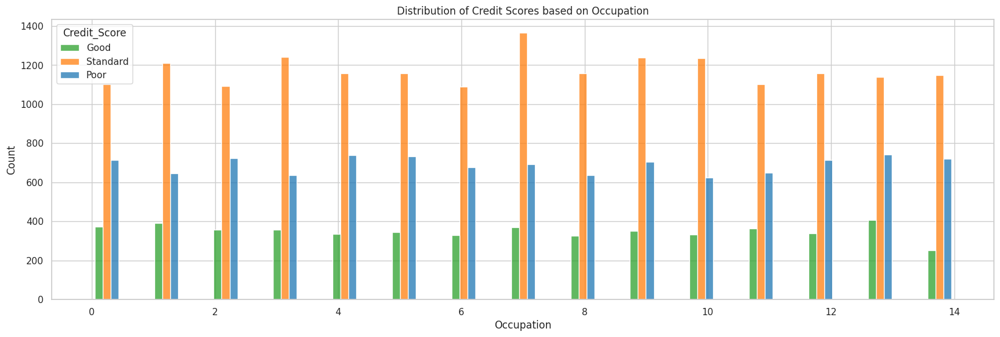

In [37]:


colors = ['#2ca02c', '#ff7f0e', '#1f77b4']
plt.figure(figsize=(20, 6))
sns.histplot(data=data_copy, x="Occupation", hue="Credit_Score", multiple="dodge", shrink=0.8, palette=colors)
plt.title("Distribution of Credit Scores based on Occupation")
plt.xlabel("Occupation")
plt.ylabel("Count")
plt.show()


**Visualization of monthly inhand salary vs credit score**

<ipython-input-38-474c7dbfde43>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data_copy['Monthly_Inhand_Salary'])


<Axes: xlabel='Monthly_Inhand_Salary', ylabel='Density'>

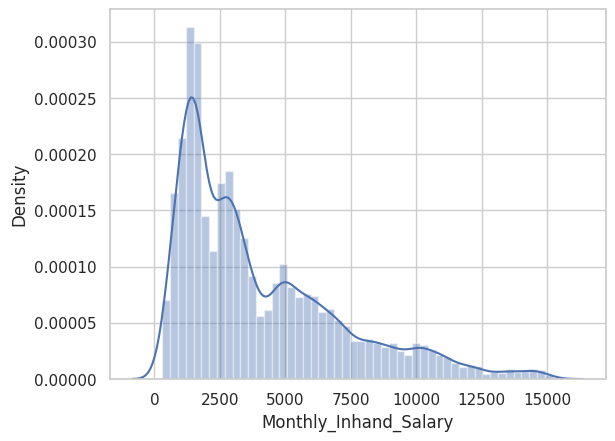

In [38]:
sns.distplot(data_copy['Monthly_Inhand_Salary'])

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/usr/local/lib/python3.10/dist-packa

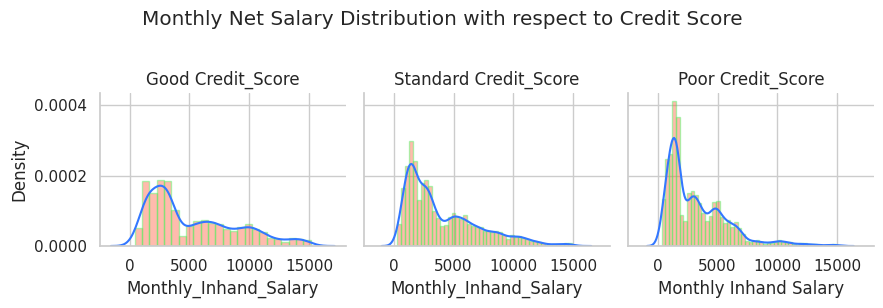

In [39]:

colors = ['#FF5733', '#33FF57', '#3377FF']
grid = sns.FacetGrid(data_copy, col='Credit_Score')
grid.map(sns.distplot, 'Monthly_Inhand_Salary', color=colors[0], kde_kws={'color': colors[2]}, hist_kws={'edgecolor': colors[1]})
grid.set_titles(col_template="{col_name} Credit_Score")
plt.xlabel("Monthly Inhand Salary")
plt.ylabel("Density")
plt.suptitle("Monthly Net Salary Distribution with respect to Credit Score", y=1.02)
plt.tight_layout()

plt.show()


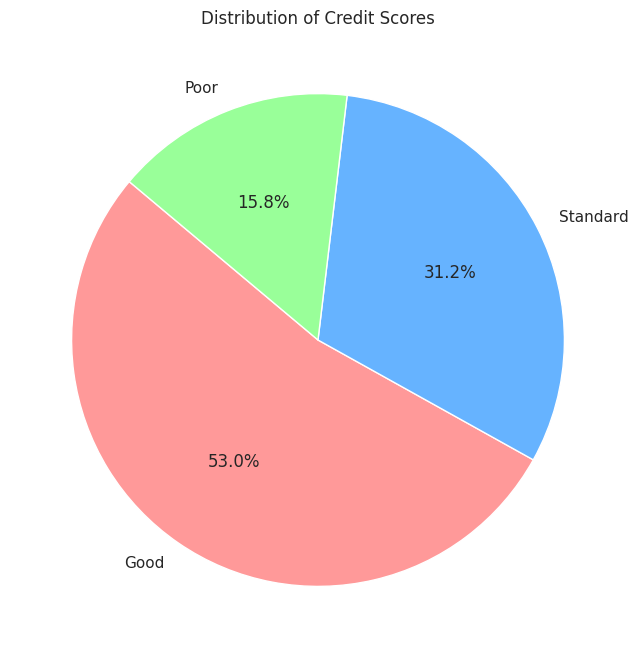

In [40]:

colors = ['#ff9999', '#66b3ff', '#99ff99']
plt.figure(figsize=(8, 8))
plt.pie(data_copy['Credit_Score'].value_counts(), labels=data_copy['Credit_Score'].unique(), autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('Distribution of Credit Scores')
plt.show()


**Visualizing the outlier in the dataset**

Index(['ID', 'Customer_ID', 'Month', 'SSN', 'Occupation',
       'Monthly_Inhand_Salary'],
      dtype='object')


<ipython-input-41-6e96735c645d>:6: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for colum,value in outlier_df.iteritems():


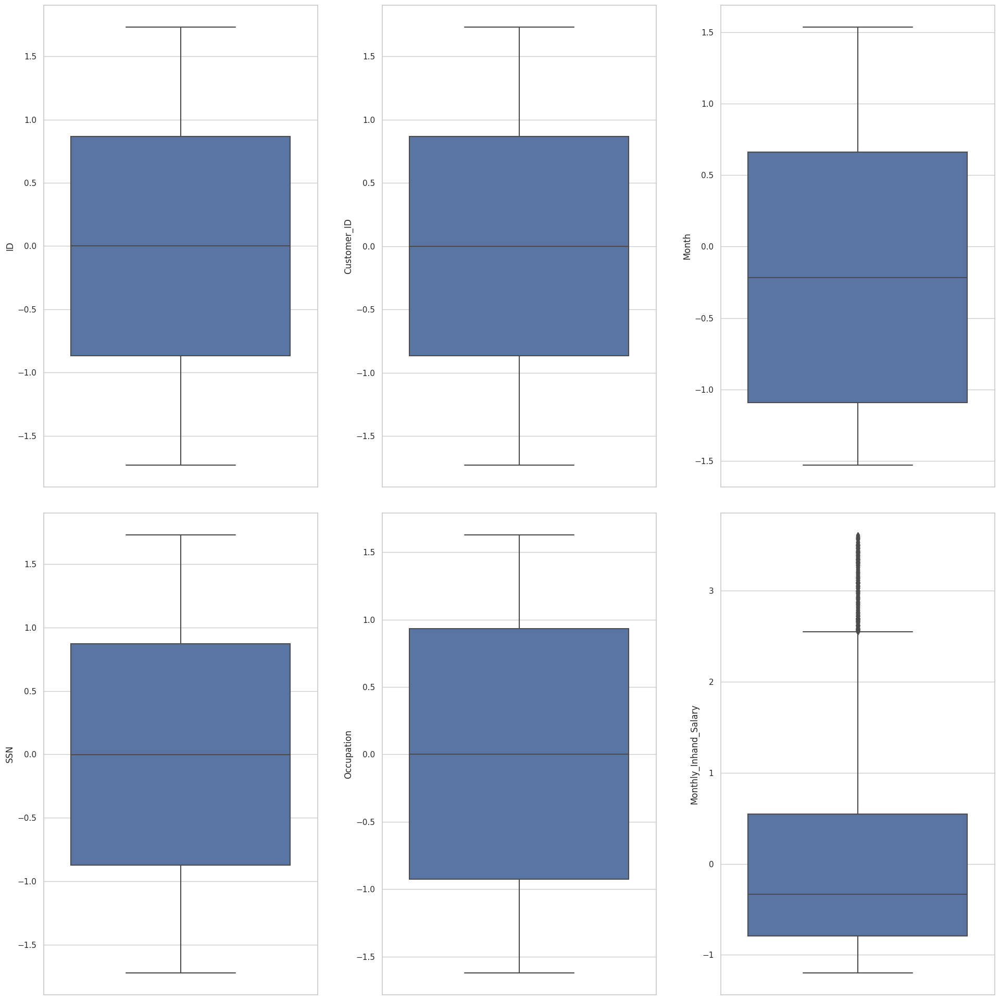

In [41]:
outlier_df = data[["ID","Customer_ID","Month","SSN","Occupation","Monthly_Inhand_Salary"]]
print(outlier_df.columns)
fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(20,20))
index = 0
ax = ax.flatten()
for colum,value in outlier_df.iteritems():
  try:
    sns.boxplot(y=colum, data=outlier_df, ax=ax[index])
    index += 1
  except:
    pass

plt.tight_layout(pad=3, w_pad=3, h_pad=3)

**Removing Outliers**

In [42]:
data.loc[data.Monthly_Inhand_Salary > 2.5,'Monthly_Inhand_Salary']=  2.5


**Visualizing after removing outliers**

Index(['ID', 'Customer_ID', 'Month', 'SSN', 'Occupation',
       'Monthly_Inhand_Salary'],
      dtype='object')


<ipython-input-43-73622c75a83b>:9: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for colum,value in df.iteritems():


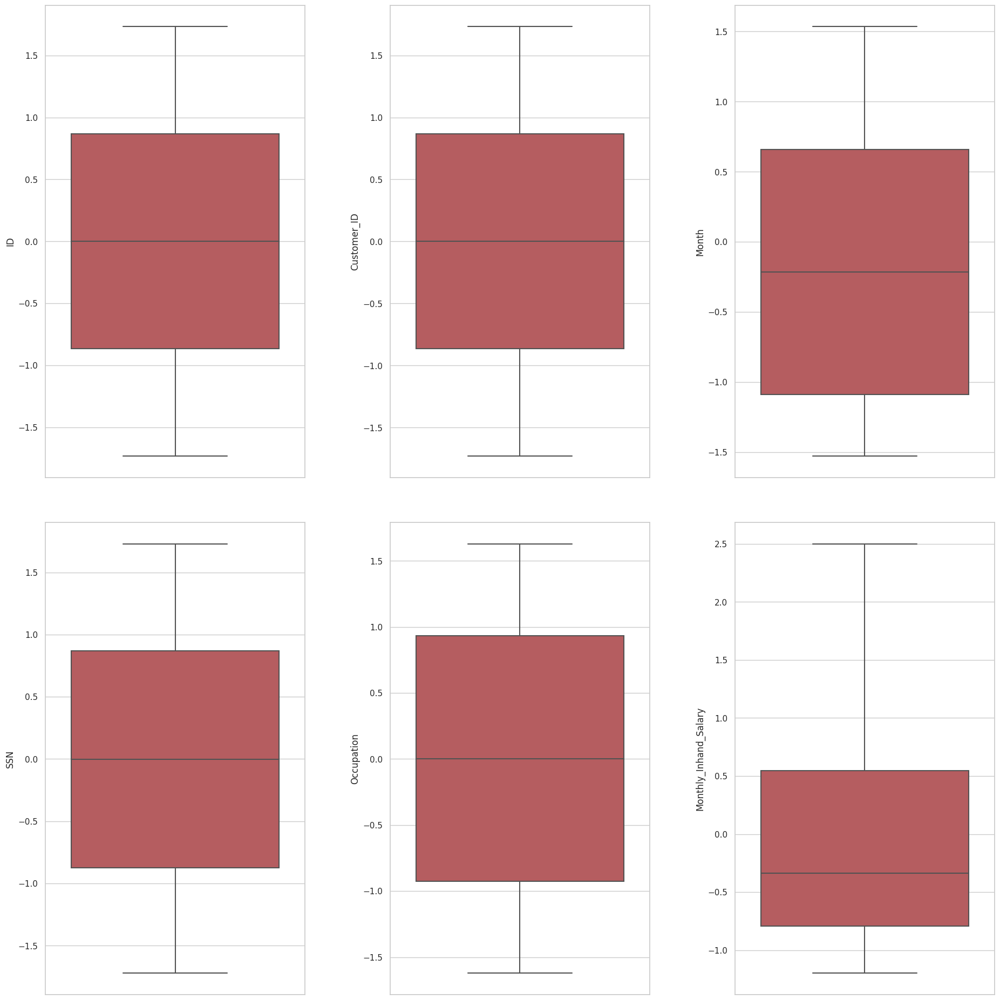

In [43]:
outlier_df = data[["ID","Customer_ID","Month","SSN","Occupation","Monthly_Inhand_Salary"]]
print(outlier_df.columns)



fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(20,20))
index = 0
ax = ax.flatten()
for colum,value in df.iteritems():
  try:
    sns.boxplot(y=colum, data=outlier_df,color = 'r', ax=ax[index])
    index += 1
  except:
    pass


plt.tight_layout(pad=5, w_pad=5, h_pad=5)

<ipython-input-44-486a0bb16a9a>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


                                ID  Customer_ID     Month       Age       SSN  \
ID                        1.000000    -0.000541  0.002130  0.000864 -0.010094   
Customer_ID              -0.000541     1.000000  0.001447  0.002661  0.004477   
Month                     0.002130     0.001447  1.000000  0.000731 -0.006653   
Age                       0.000864     0.002661  0.000731  1.000000 -0.001159   
SSN                      -0.010094     0.004477 -0.006653 -0.001159  1.000000   
Occupation                0.012365     0.007988 -0.003670 -0.006767 -0.007631   
Annual_Income            -0.007245    -0.006373  0.006749 -0.002262  0.001874   
Monthly_Inhand_Salary    -0.003055     0.014766  0.010446  0.009639 -0.016382   
Num_Bank_Accounts        -0.005022    -0.008050  0.002670  0.008210  0.004893   
Num_Credit_Card          -0.005829     0.006046  0.002344 -0.002046 -0.005811   
Interest_Rate            -0.006776     0.002927 -0.000596 -0.004788 -0.006383   
Num_of_Loan               0.

<Axes: >

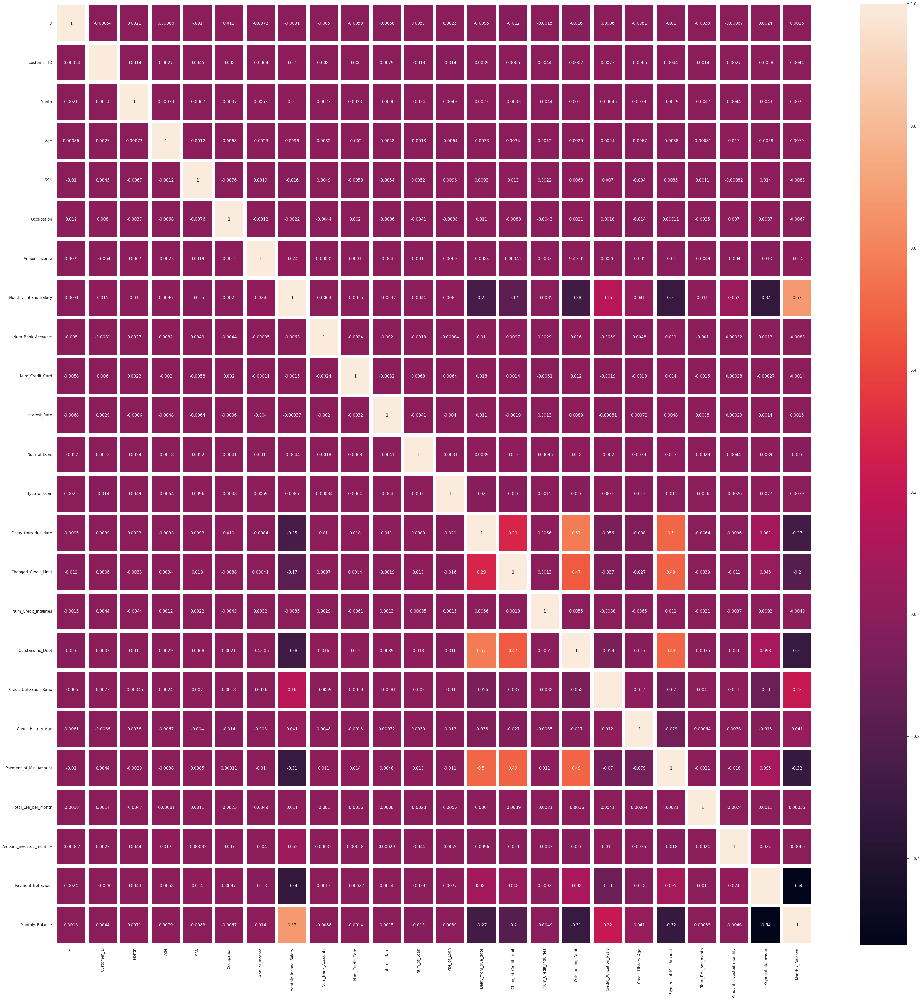

In [44]:
correlation_matrix = data.corr()
print(correlation_matrix)

fig, ax = plt.subplots(figsize=(50,50))

sns.heatmap(correlation_matrix, annot=True, linewidths=10, ax=ax)

**Feature Importance**

In [45]:
# Feature importance
from sklearn.feature_selection import SelectKBest, f_classif
print(data)
X = data.drop(["Credit_Score","Name"], axis=1)
y = data["Credit_Score"]
feature_Selection = SelectKBest(score_func=f_classif, k="all")
feature_Selection.fit(X, y)
val1 = sum(feature_Selection.scores_)
val2 = feature_Selection.scores_/val1
total = val2 *100
result_dict = {}
for i, j in enumerate(X.columns):
  result_dict[j] = total[i]

print(result_dict)

             ID  Customer_ID     Month             Name       Age       SSN  \
0     -1.159936     1.681322 -0.215243    Aaron Maashoh -0.136309  1.111146   
6     -1.156596     1.681322  0.222281    Aaron Maashoh -0.136309  1.111146   
9     -1.153883    -1.437372 -0.652767  Rick Rothackerj -0.129131 -1.707439   
10    -1.153466    -1.437372  1.097330  Rick Rothackerj -0.129131 -1.707439   
12    -1.152318    -1.437372  1.534854  Rick Rothackerj -0.129131 -1.707439   
...         ...          ...       ...              ...       ...       ...   
99991  0.442822     0.438640 -1.090292   Sarah McBridec -0.127696 -1.613333   
99994  0.442926     0.713903  1.097330            Nicks -0.133438 -1.449843   
99995  0.443031     0.713903 -1.527816            Nicks -0.133438 -1.449843   
99996  0.443135     0.713903  1.534854            Nicks -0.133438 -1.449843   
99997  0.443239     0.713903  0.659806            Nicks -0.133438 -1.449843   

       Occupation  Annual_Income  Monthly_Inhand_Sa

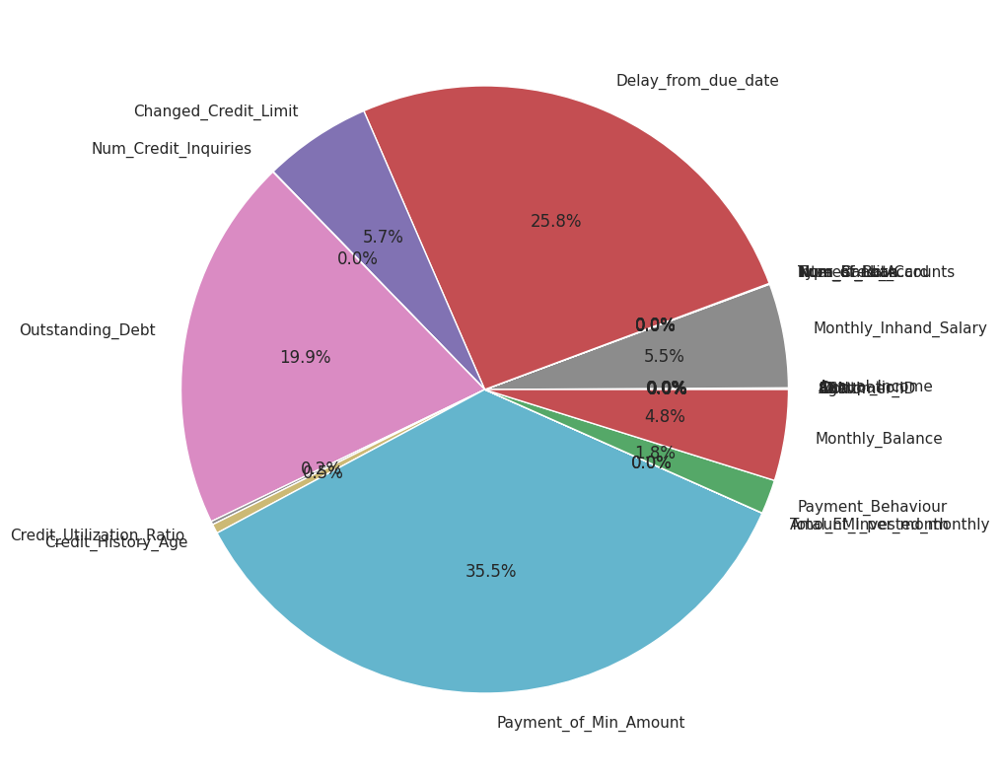

In [46]:
plt.figure(figsize = (10, 10))
# plt.pie([float(your_data[v]) for v in result_dict], labels=[str(k) for k in result_dict], autopct='%1.1f%%')
plt.pie(result_dict.values(), labels=result_dict.keys(),autopct='%1.1f%%')
plt.show()

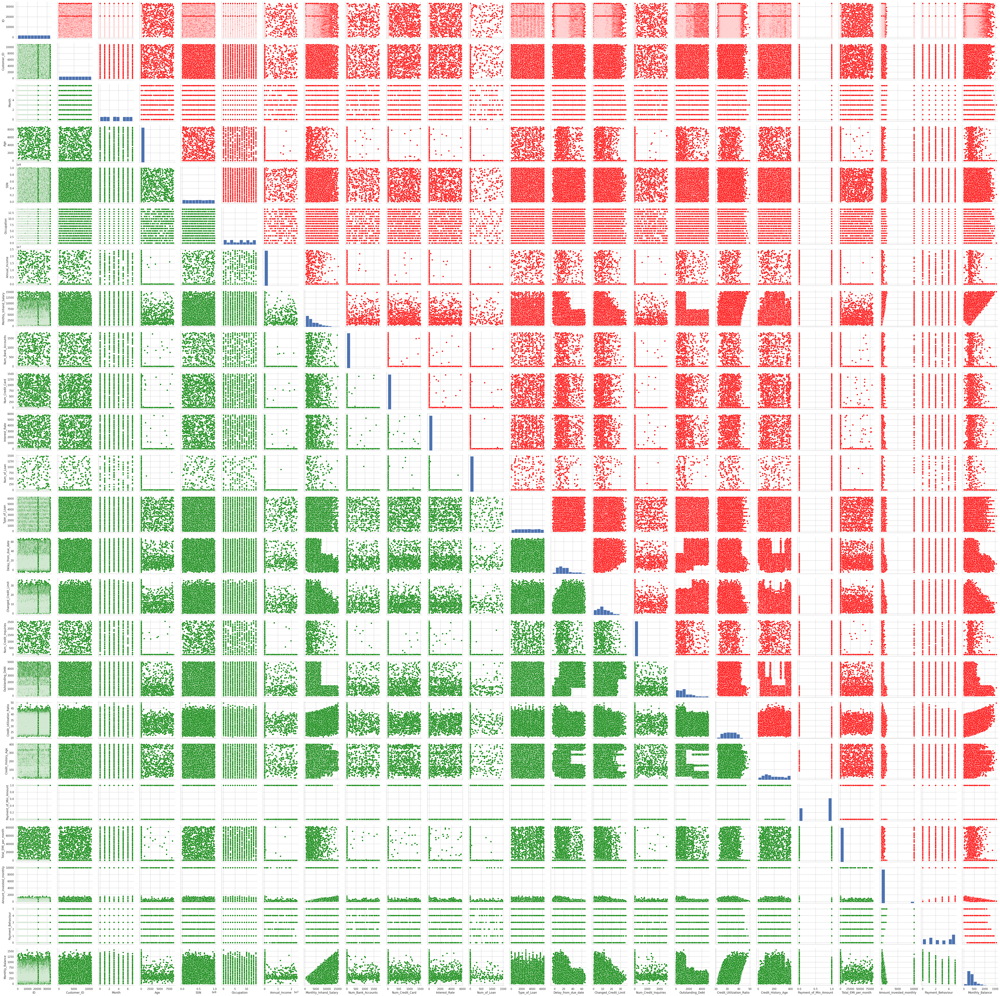

In [47]:
g = sns.PairGrid(data_copy)

g.map_upper(sns.scatterplot,color='red')

g.map_lower(sns.scatterplot, color='green')

g.map_diag(plt.hist)